<a href="https://colab.research.google.com/github/Bhumit9416/Attendance-Management-system-using-face-recognition/blob/main/CV03_HumanPose_OpenPose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pose Detection with OpenPose

This notebook uses an open source project [CMU-Perceptual-Computing-Lab/openpose](https://github.com/CMU-Perceptual-Computing-Lab/openpose.git) to detect/track multi person poses on a given youtube video.

For other deep-learning Colab notebooks, visit [tugstugi/dl-colab-notebooks](https://github.com/tugstugi/dl-colab-notebooks).

Reference: [OpenPose](https://google.github.io/mediapipe/solutions/pose.html) by MediaPipe.




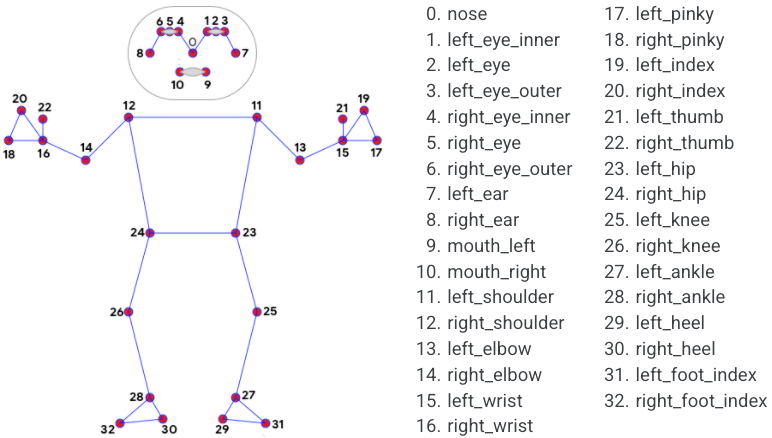

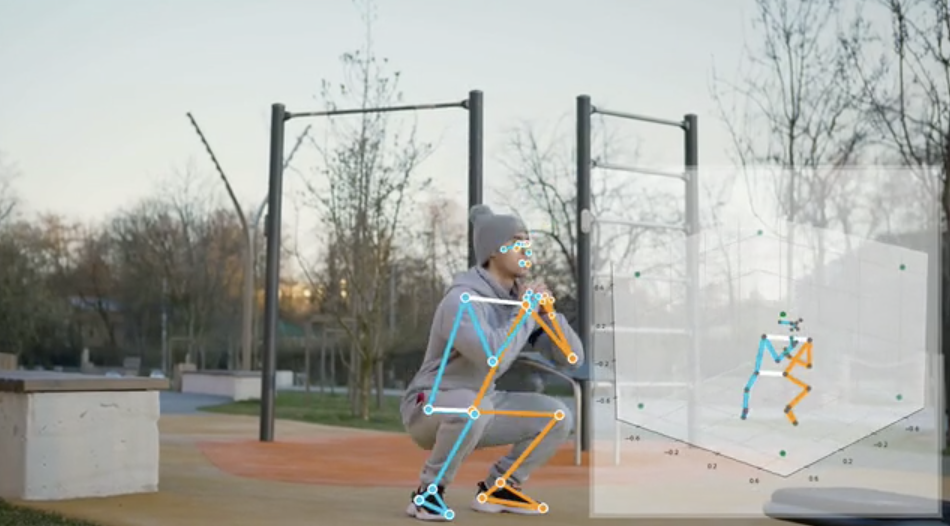

## Install OpenPose

In [1]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # see: https://github.com/CMU-Perceptual-Computing-Lab/openpose/issues/949
  # install new CMake becaue of CUDA10
  !wget -q https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
  !tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local
  # clone openpose
  !git clone -q --depth 1 $git_repo_url
  !sed -i 's/execute_process(COMMAND git checkout master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt
  # install system dependencies
  !apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev
  # install python dependencies
  !pip install -q youtube-dl
  # build openpose
  !cd openpose && rm -rf build || true && mkdir build && cd build && cmake .. && make -j`nproc`

from IPython.display import YouTubeVideo

Selecting previously unselected package liblmdb0:amd64.
(Reading database ... 123630 files and directories currently installed.)
Preparing to unpack .../00-liblmdb0_0.9.24-1build2_amd64.deb ...
Unpacking liblmdb0:amd64 (0.9.24-1build2) ...
Selecting previously unselected package libgflags2.2.
Preparing to unpack .../01-libgflags2.2_2.2.2-2_amd64.deb ...
Unpacking libgflags2.2 (2.2.2-2) ...
Selecting previously unselected package libgflags-dev.
Preparing to unpack .../02-libgflags-dev_2.2.2-2_amd64.deb ...
Unpacking libgflags-dev (2.2.2-2) ...
Selecting previously unselected package libgoogle-glog0v5.
Preparing to unpack .../03-libgoogle-glog0v5_0.5.0+really0.4.0-2_amd64.deb ...
Unpacking libgoogle-glog0v5 (0.5.0+really0.4.0-2) ...
Selecting previously unselected package libunwind-dev:amd64.
Preparing to unpack .../04-libunwind-dev_1.3.2-2build2.1_amd64.deb ...
Unpacking libunwind-dev:amd64 (1.3.2-2build2.1) ...
Selecting previously unselected package libgoogle-glog-dev.
Preparing to un

# Some functions

In [2]:
def play_mp4(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))


# Example 1: Video mp4

In [13]:
!pip install gdown


In [14]:
!gdown "https://drive.google.com/uc?id=1O9MtmxsAEfc6Tkm7k0z54WD8ik47tQVv"


Downloading...
From: https://drive.google.com/uc?id=1O9MtmxsAEfc6Tkm7k0z54WD8ik47tQVv
To: /content/dancingvideo.MOV
100% 8.76M/8.76M [00:00<00:00, 12.8MB/s]


In [17]:
!cp dancingvideo.MOV video.mp4

In [20]:
play_mp4('video.mp4',width=960, height=720)

## Example 2: Video from YouTube

We are going to detect poses on the following youtube video:

In [25]:
!pip install -U youtube-dl


In [26]:
!pip install -U yt-dlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.1/172.1 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 82.6 MB/s eta 0:00:00


In [27]:
YOUTUBE_ID = 'RXABo9hm8B8'

In [28]:
!rm -rf youtube.mp4

In [29]:
!yt-dlp -f 'bestvideo[ext=mp4]+bestaudio[ext=m4a]/mp4' --merge-output-format mp4 -o "youtube.mp4" https://www.youtube.com/watch?v=$YOUTUBE_ID


[youtube] Extracting URL: https://www.youtube.com/watch?v=RXABo9hm8B8
[youtube] RXABo9hm8B8: Downloading webpage
[youtube] RXABo9hm8B8: Downloading ios player API JSON
[youtube] RXABo9hm8B8: Downloading mweb player API JSON
[youtube] RXABo9hm8B8: Downloading player 89dfc5b3
[youtube] RXABo9hm8B8: Downloading m3u8 information
[info] RXABo9hm8B8: Downloading 1 format(s): 399+140
[download] Destination: youtube.f399.mp4
[download] 100% of   55.14MiB in 00:00:01 at 28.67MiB/s
[download] Destination: youtube.f140.m4a
[download] 100% of    7.43MiB in 00:00:00 at 37.20MiB/s
[Merger] Merging formats into "youtube.mp4"
Deleting original file youtube.f399.mp4 (pass -k to keep)
Deleting original file youtube.f140.m4a (pass -k to keep)


In [30]:
!ffmpeg -y -loglevel info -i youtube.mp4 -t 10 video.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

Download the above youtube video, cut the first 10 seconds

# Pose detecion on video.mp4

In [31]:
!rm openpose.avi


rm: cannot remove 'openpose.avi': No such file or directory


In [33]:
!apt-get update
!apt-get install -y build-essential cmake libopencv-dev libopenblas-dev liblapack-dev libx264-dev libjpeg-dev


Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:5 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:6 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:7 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:9 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:10 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [2,734 kB]
Get:11 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:12 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,172 kB]
Get:13 http://archive.ubuntu.com/ubuntu jamm

In [35]:
!git clone https://github.com/CMU-Perceptual-Computing-Lab/openpose.git


fatal: destination path 'openpose' already exists and is not an empty directory.


In [36]:
!cd openpose && mkdir build && cd build && cmake .. && make -j`nproc`


mkdir: cannot create directory ‘build’: File exists


In [38]:
!cd openpose/build && make -j2


make: *** No targets specified and no makefile found.  Stop.


In [39]:
!apt-get install -y nvidia-cuda-toolkit


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fonts-dejavu-core fonts-dejavu-extra libaccinj64-11.5 libatk-wrapper-java libatk-wrapper-java-jni
  libbabeltrace1 libcub-dev libcublas11 libcublaslt11 libcudart11.0 libcufft10 libcufftw10
  libcuinj64-11.5 libcupti-dev libcupti-doc libcupti11.5 libcurand10 libcusolver11 libcusolvermg11
  libcusparse11 libdebuginfod-common libdebuginfod1 libegl-dev libfontenc1 libgail-common libgail18
  libgl-dev libgl1-mesa-dev libgles-dev libgles1 libglvnd-core-dev libglvnd-dev libglx-dev
  libgtk2.0-0 libgtk2.0-bin libgtk2.0-common libipt2 libnppc11 libnppial11 libnppicc11 libnppidei11
  libnppif11 libnppig11 libnppim11 libnppist11 libnppisu11 libnppitc11 libnpps11 libnvblas11
  libnvidia-compute-495 libnvidia-compute-510 libnvidia-compute-535 libnvidia-ml-dev libnvjpeg11
  libnvrtc-builtins11.5 libnvrtc11.2 libnvtoolsext1 libnvvm4 libopengl-dev libr

In [41]:
!git clone https://github.com/CMU-Perceptual-Computing-Lab/openpose.git


fatal: destination path 'openpose' already exists and is not an empty directory.


In [42]:
!apt-get update
!apt-get install -y build-essential cmake libopencv-dev libopenblas-dev liblapack-dev libx264-dev libjpeg-dev libgflags-dev libgoogle-glog-dev libboost-all-dev


Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:3 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:4 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Hit:10 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Fetched 257 kB in 1s (269 kB/s)
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package list

In [43]:
!cd openpose && mkdir build && cd build && cmake .. && make -j`nproc`


mkdir: cannot create directory ‘build’: File exists


In [45]:
!ls openpose


3rdparty      build  CMakeLists.txt  examples  LICENSE	python	   scripts
appveyor.yml  cmake  doc	     include   models	README.md  src


In [46]:
!git clone https://github.com/CMU-Perceptual-Computing-Lab/openpose.git


fatal: destination path 'openpose' already exists and is not an empty directory.


In [47]:
!apt-get update
!apt-get install -y build-essential cmake libopencv-dev libopenblas-dev liblapack-dev libx264-dev libjpeg-dev libgflags-dev libgoogle-glog-dev libboost-all-dev


Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:4 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:6 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:7 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Hit:9 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:10 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading

In [48]:
!apt-get install -y nvidia-cuda-toolkit


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
nvidia-cuda-toolkit is already the newest version (11.5.1-1ubuntu1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


In [49]:
!cd openpose && mkdir build && cd build && cmake .. && make -j`nproc`


mkdir: cannot create directory ‘build’: File exists


In [52]:
!ls openpose/build/examples/openpose/


ls: cannot access 'openpose/build/examples/openpose/': No such file or directory


Finally, visualize the result: